In [1]:
import pandas as pd

In [2]:
import numpy as np

In [89]:
import matplotlib.pyplot as plt
from matplotlib.colors import Colormap
import matplotlib.patches as patches

In [4]:
from scipy.signal import savgol_filter

In [111]:
from datetime import datetime

In [110]:
from astroquery.hips2fits import hips2fits
import astropy.units as u
from astropy.coordinates import Longitude, Latitude, Angle, SkyCoord, EarthLocation, AltAz
from astropy.time import Time

In [5]:
#snr = []

#for i in range(len(spectra_per_hour)):
 #   current = np.array(spectra_per_hour[i])
  #  edge_size = int(len(current) * 0.15)
  #  baseline_regions = np.concatenate([current[:edge_size], current[-edge_size:]])
  #  baseline = np.median(baseline_regions)
  #  noise_std = np.std(baseline_regions)
  #  snr_data = (current - baseline) / noise_std
  #  snr.append(snr_data)

In [6]:
df = pd.read_csv("150-42-autosave.csv", sep=",") 

In [7]:
fft_size = df.iloc[0]["FFT Size"]
center_frequency = df.iloc[0]["Centre Freq"]
sample_rate = df.iloc[0]["Sample Rate"]
resolution = sample_rate / fft_size
offset = np.arange(fft_size) * resolution - sample_rate / 2
frequencies = center_frequency + offset

In [8]:
data_idx = df.columns.get_loc("Data")

In [46]:
spectra = []
for i in range(len(df)):
    row = df.iloc[i]
    datetime_data = row["Date Time"]
    data = row.tolist()[data_idx:data_idx + fft_size]
    spectra.append({"datetime": datetime_data, "data": np.array(data)})
spectra = np.array(spectra)

In [156]:
n_bg = 1
bg_spectra = (list(curr["data"] for curr in spectra))[:n_bg]
bg_mean = np.mean(bg_spectra, axis=0)

In [161]:
n_average = 1
averaged_spectra_snr = []
n_all = len(df) - n_bg
n_done = n_bg
std = np.std(bg_mean)

while n_all - n_average > n_done:
    spectra_with_time = spectra[n_done:n_done + n_average]
    spectra_datetime = spectra_with_time[0]["datetime"]
    spectral_data = list(curr["data"] for curr in spectra_with_time)
    signal_mean = np.mean(spectral_data, axis=0)
    diff = (signal_mean - bg_mean) / std
    smoothed_snr = savgol_filter(diff, 5, 3)
    averaged_spectra_snr.append({"datetime": spectra_datetime, "data": smoothed_snr})
    n_done += n_average

In [162]:
current_az = 135.0   
current_alt = 41.0 
location = EarthLocation(lat=47.1368*u.deg, lon=7.2468*u.deg, height=437*u.m)

/tmp/ipykernel_101365/629541545.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(


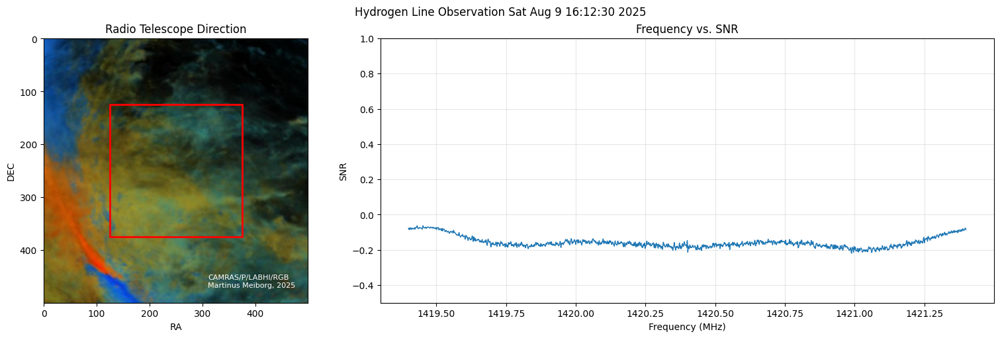

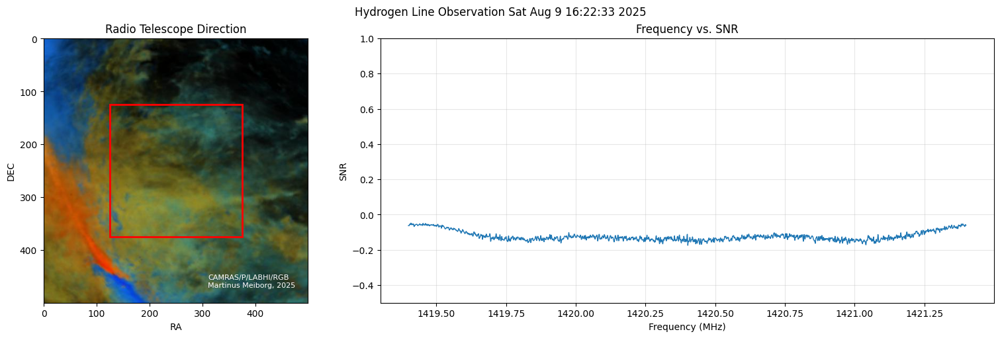

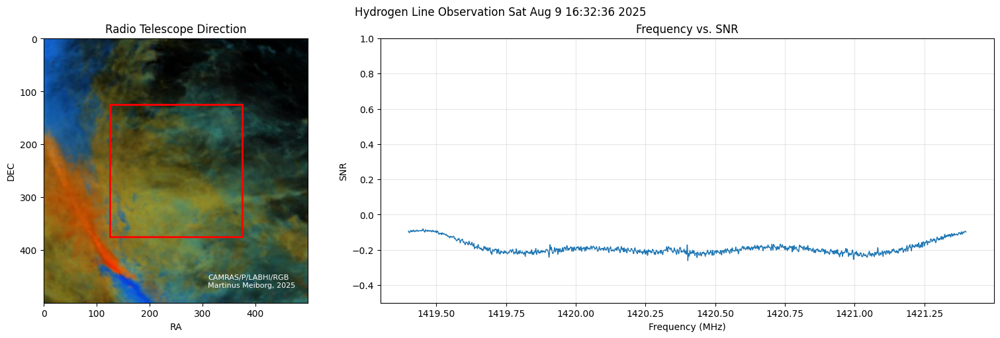

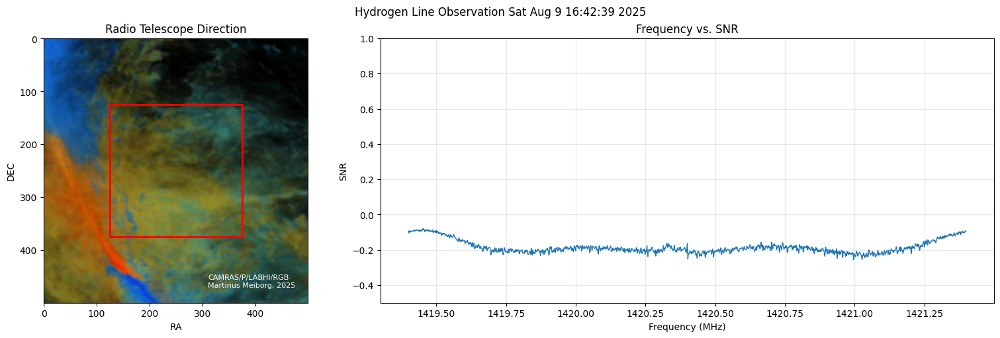

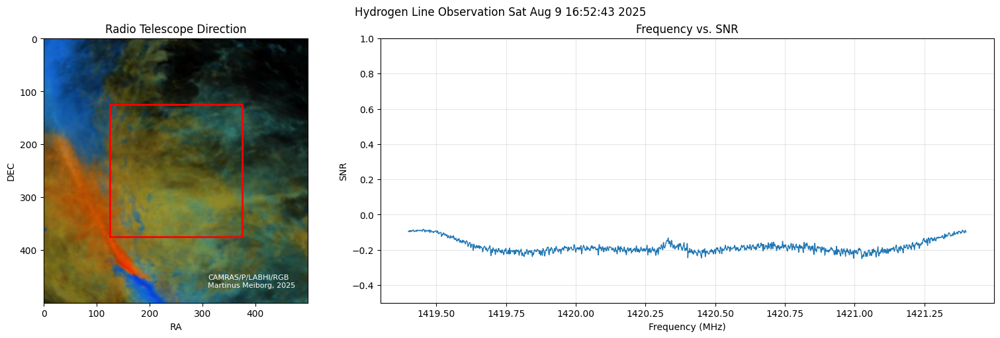

...

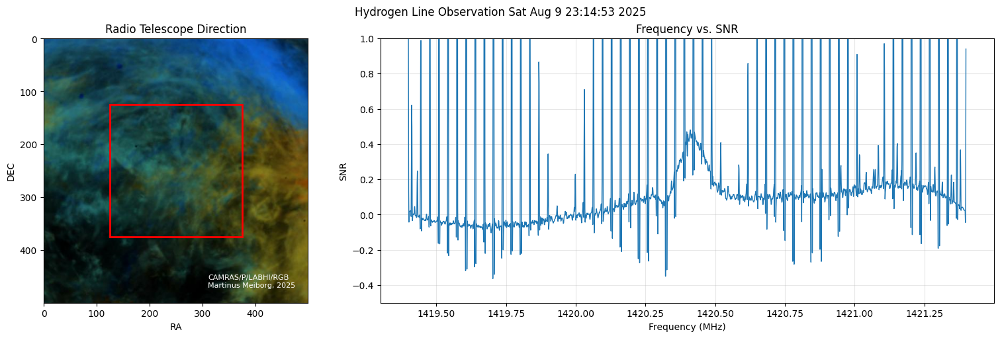

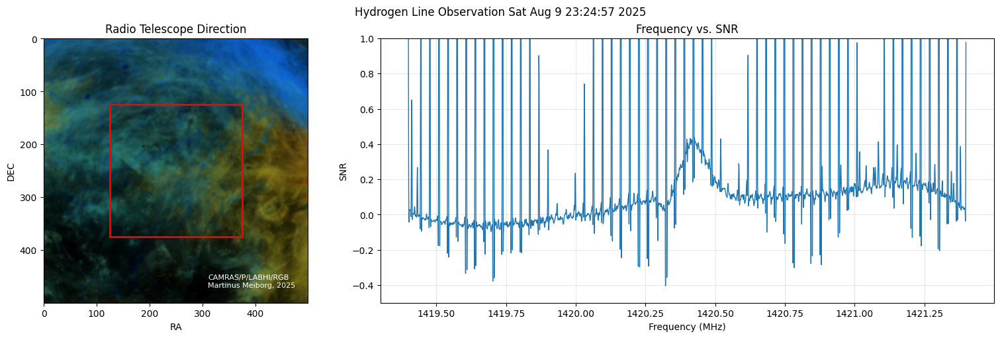

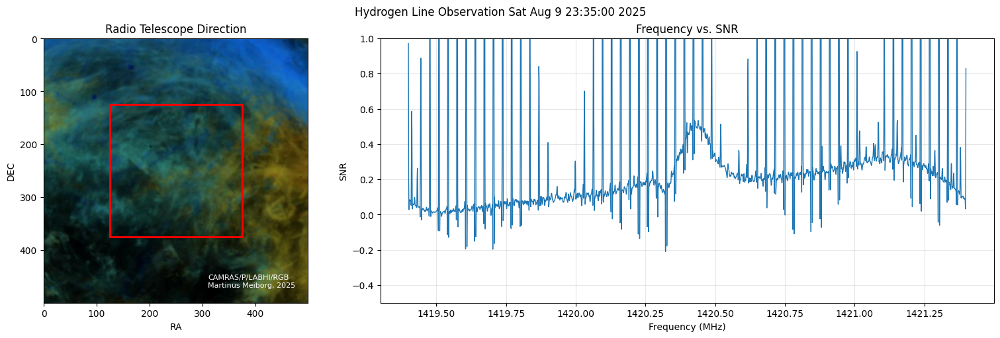

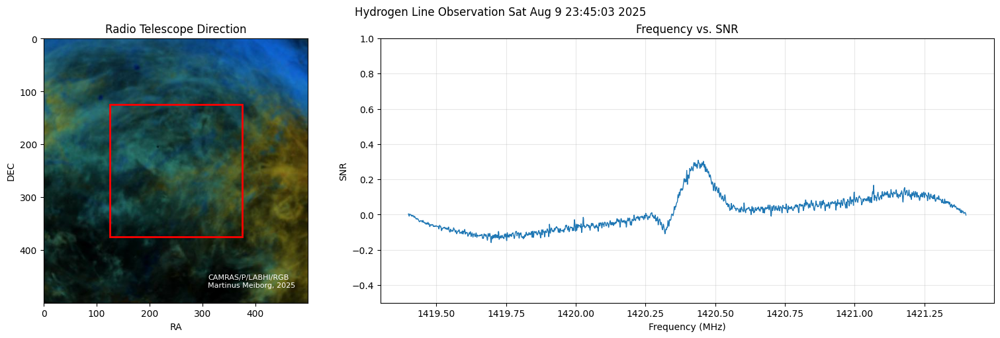

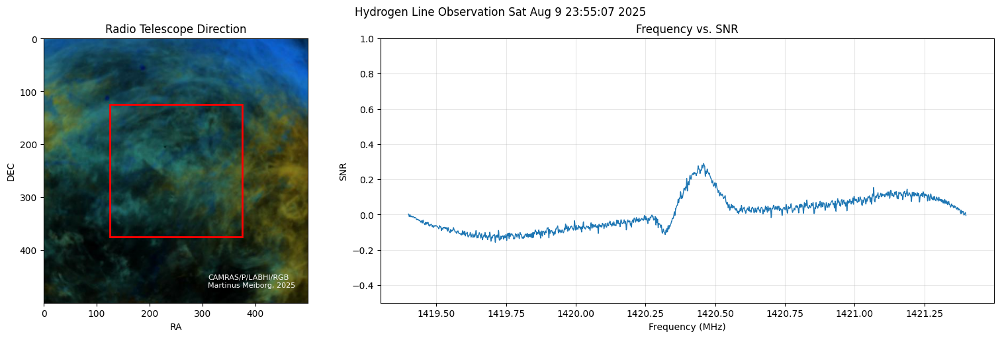

In [163]:
for i in range(len(averaged_spectra_snr)):
    current_spectra = averaged_spectra_snr[i]
    iso_time = datetime.strptime(current_spectra["datetime"], "%a %b %d %H:%M:%S %Y")
    time = Time(iso_time)
    altaz_frame = AltAz(obstime=time, location=location)
    current_pointing = SkyCoord(az=current_az*u.deg, alt=current_alt*u.deg, frame=altaz_frame)
    current_radec = current_pointing.transform_to('icrs')
    
    fig, ax = plt.subplots(
        nrows=1, 
        ncols=2, 
        figsize=(15, 5),
        gridspec_kw={'width_ratios': [1, 2]},
        constrained_layout=True
    )
    
    ax[1].plot(frequencies / 1e6, current_spectra["data"], linewidth=1)
    ax[1].set_ylim(-0.5, 1)
    ax[1].set_title('Frequency vs. SNR')
    ax[1].set_xlabel('Frequency (MHz)')
    ax[1].set_ylabel('SNR')
    ax[1].grid(True, alpha=0.3)
    
    hips = 'CAMRAS/P/LABHI/RGB'
    
    result = hips2fits.query(
       hips=hips,
       width=500,
       height=500,
       ra=Longitude(current_radec.ra.degree * u.deg),
       dec=Latitude(current_radec.dec.degree * u.deg),
       fov=Angle(90 * u.deg),
       projection="AIT",
       get_query_payload=False,
       format='jpg',
       min_cut=0.5,
       max_cut=99.5,
       cmap=Colormap('viridis'),
    )
    
    square = patches.Rectangle((125, 125), 250, 250, edgecolor='red', facecolor='none', linewidth=2)
    ax[0].add_patch(square)
    ax[0].imshow(result)
    
    ax[0].set_title('Radio Telescope Direction')
    ax[0].set_xlabel('RA')
    ax[0].set_ylabel('DEC')
    ax[0].text(310, 470, 'CAMRAS/P/LABHI/RGB\nMartinus Meiborg, 2025', fontsize = 8, color='white')
    
    plt.suptitle('Hydrogen Line Observation ' + current_spectra["datetime"])
    #plt.show()
    plt.savefig("plots/1_average_h1/observation-" + str(iso_time) + ".png")